## 사전 준비(모델, 라이브러리 설치)

*   `import segmentation_models as sm` 에러 발생 시 init 파일 클릭 하여 문제가 되는 문장 제거. init.py 저장 후 세션 재시작




In [ ]:
!pip install segmentation_models


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import numpy as np
from glob import glob
from scipy.io import loadmat
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import shutil

from zipfile import ZipFile
import tempfile
from google.colab import drive

import segmentation_models as sm
from tensorflow.keras.metrics import MeanIoU
import random



Segmentation Models: using `keras` framework.


## 데이터 셋 다운로드

In [ ]:

# 경로 설정
drive.mount('/content/drive')


# 경로 설정
data_path = '/content/drive/MyDrive/2024_JEJU_AI/'
extracted_folder_path = '/content/data'


# 압축파일 풀기
with ZipFile(data_path + 'final_dataset.zip') as zipper:
    zipper.extractall(extracted_folder_path)


print("압축 파일을 성공적으로 풀었습니다.")


Mounted at /content/drive
압축 파일을 성공적으로 풀었습니다.


In [ ]:
from PIL import Image

# 이미지 경로
image_path = "/content/data/content/final_dataset/train_images/train/20D0215_0169.jpg"

# 이미지 열기
image = Image.open(image_path)

# 이미지의 너비, 높이, 채널 수 출력

print("이미지 SHAPE:", image.size)


이미지 SHAPE: (512, 512)


Labels for 20D0358_0153.jpg contain 0. [0 4 8] Counts: [ 26872  91582 143690]


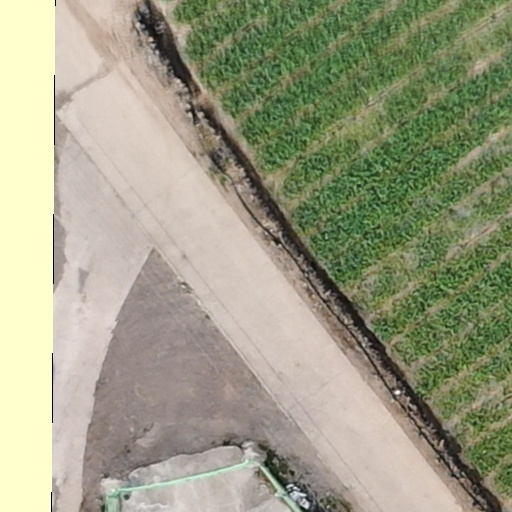

Labels for 20D1023_04_0192.jpg contain 0. [0 5 8] Counts: [ 22069   4449 235626]


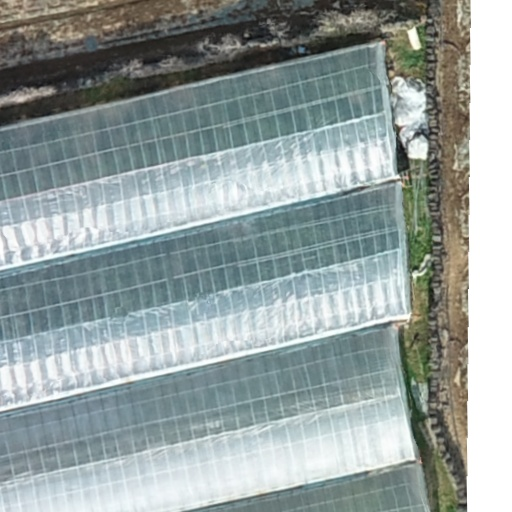

Labels for 20D0224_0021.jpg contain 0. [0 8] Counts: [ 36480 225664]


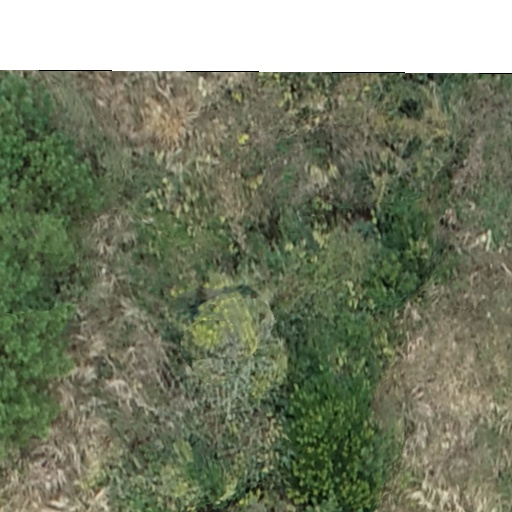

Labels for 20D0415_02_2923.jpg contain 0. [0] Counts: [262144]


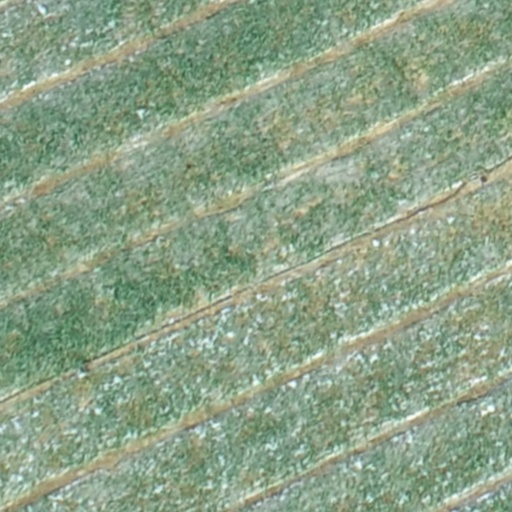

In [ ]:
from google.colab.patches import cv2_imshow

#이미지 확인.
image_dir = '/content/data/content/final_dataset/train_masks/train'
image_files = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]

random_images = random.sample(image_files, 15)

for image_file in random_images:
    # 이미지 파일 로드
    image_path = os.path.join(image_dir, image_file)
    temp_mask = cv2.imread(image_path)

    # 라벨 및 카운트 출력
    labels, count = np.unique(temp_mask[:, :, 0], return_counts=True)
    # print(f"Labels for {image_file}: {labels}, Counts: {count}")

    if 0 in labels:
        print(f"Labels for {image_file} contain 0. {labels} Counts: {count}")
        origin_image_path = os.path.join('/content/data/content/final_dataset/train_images/train', image_file)
        # origin_image = cv2.imread(origin_image_path)
        img = cv2.imread(origin_image_path, cv2.IMREAD_COLOR)
        cv2_imshow(img)


## 모델 설정

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input
BACKBONE = 'efficientnetb7'


seed=24
batch_size= 32
n_classes=9

def preprocess_data(img, mask, num_class):
    # 이미지 스케일링
    # img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)

    # 사전 훈련된 백본을 기반으로 전처리
    img = preprocess_input(img)

    #마스크를 원-핫 인코딩으로 변환
    mask = to_categorical(mask, num_class)


    return (img,mask)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.utils import to_categorical

def trainGenerator(train_img_path, train_mask_path, num_class):
    # ImageDataGenerator에 적용할 인자 설정

    img_data_gen_args = dict(horizontal_flip=True,
                             vertical_flip=True,
                             fill_mode='reflect')

    # 이미지 및 마스크에 대한 ImageDataGenerator 객체 생성

    image_datagen = ImageDataGenerator(**img_data_gen_args)
    mask_datagen = ImageDataGenerator(**img_data_gen_args)

    # flow_from_directory 함수를 통해 이미지 데이터 생성
    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode=None,
        batch_size=batch_size,
        target_size=(128, 128),
        seed=seed)

    # flow_from_directory 함수를 통해 마스크 데이터 생성
    mask_generator = mask_datagen.flow_from_directory(
        train_mask_path,
        class_mode=None,
        color_mode='grayscale',
        batch_size=batch_size,
        target_size=(128, 128),
        seed=seed)

    # 이미지 및 마스크 데이터를 결합하여 훈련 데이터 제너레이터 생성
    train_generator = zip(image_generator, mask_generator)

    # 훈련 데이터 제너레이터에서 이미지 및 마스크를 반복하여 전처리 및 출력
    for (img, mask) in train_generator:
        # 전처리 함수(preprocess_data)를 통해 이미지 및 마스크를 전처리
        img, mask = preprocess_data(img, mask, num_class)
        # 전처리된 이미지와 마스크를 반환
        yield (img, mask)


In [ ]:
train_img_path = '/content/data/content/final_dataset/train_images/'
train_mask_path = '/content/data/content/final_dataset/train_masks/'
train_img_gen = trainGenerator(train_img_path, train_mask_path, num_class=9)

val_img_path = '/content/data/content/final_dataset/val_images/'
val_mask_path = '/content/data/content/final_dataset/val_masks/'
val_img_gen = trainGenerator(val_img_path, val_mask_path, num_class=9)



Found 54209 images belonging to 1 classes.
Found 54209 images belonging to 1 classes.


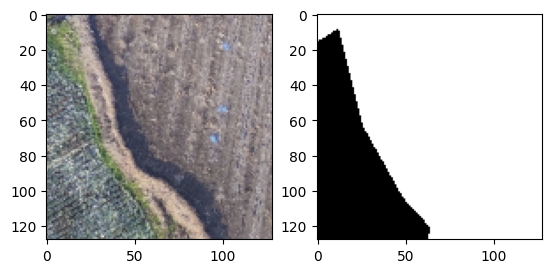

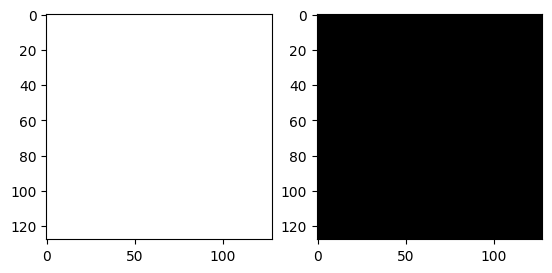

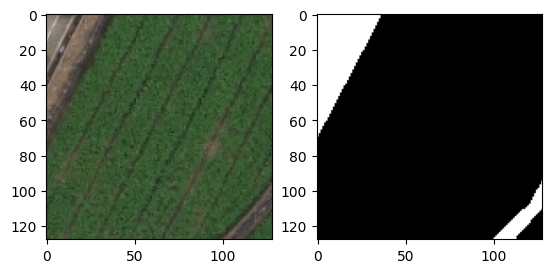

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
x, y = train_img_gen.__next__()

for i in range(0,3):
    image = x[i]
    image = image / 255


    mask = np.argmax(y[i], axis=2)
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.show()



In [ ]:
x_val, y_val = val_img_gen.__next__()

for i in range(0,3):
    image = x_val[i]
    image = image / 255

    mask = np.argmax(y_val[i], axis=2)
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.show()


In [ ]:
import os
num_train_imgs = len(os.listdir('/content/data/content/final_dataset/train_images/train'))
num_val_images = len(os.listdir('/content/data/content/final_dataset/val_images/val'))

steps_per_epoch = num_train_imgs//batch_size
val_steps_per_epoch = num_val_images//batch_size

IMG_HEIGHT = x.shape[1]
IMG_WIDTH  = x.shape[2]
IMG_CHANNELS = x.shape[3]

n_classes=9

In [ ]:
model = sm.Unet(BACKBONE, encoder_weights='imagenet',
                input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
                classes=n_classes, activation='softmax')
model.compile('Adam', loss=sm.losses.categorical_focal_jaccard_loss, metrics=[sm.metrics.iou_score])

#Other losses to try: categorical_focal_dice_loss, cce_jaccard_loss, cce_dice_loss, categorical_focal_loss



In [ ]:
print(model.summary())
print(model.input_shape)


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 stem_conv (Conv2D)          (None, 64, 64, 64)           1728      ['input_2[0][0]']             
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 64, 64, 64)           256       ['stem_conv[0][0]']           
 n)                                                                                               
                                                                                                  
 stem_activation (Activatio  (None, 64, 64, 64)           0         ['stem_bn[0][0]']       

## 모델 학습

In [ ]:
from keras.callbacks import ModelCheckpoint

# ModelCheckpoint 콜백 설정: 가장 좋은(성능이 우수한) 모델 저장
checkpoint_best = ModelCheckpoint('best_model_70000_128_efficientnet7.hdf5',
                                  monitor='val_loss',  # 모델 성능을 평가할 지표
                                  save_best_only=True,  # 가장 좋은 모델만 저장
                                  mode='min',  # 성능 지표가 감소해야 함 (예: 손실 함수에서 낮은 값이 더 좋음)
                                  verbose=1)

# ModelCheckpoint 콜백 설정: 마지막 에포크에서의 모델 저장
checkpoint_final = ModelCheckpoint('final_model_70000_128_efficientnet7.hdf5',
                                   save_best_only=False,  # 모든 모델을 저장
                                   verbose=1)



In [ ]:
from keras.callbacks import Callback

class LabelScoresCallback(Callback):
    def __init__(self, validation_data):
        super(LabelScoresCallback, self).__init__()
        self.validation_data = validation_data

    def on_epoch_end(self, epoch, logs=None):
        x_val, y_val = self.validation_data

        # 검증 데이터셋에서 예측 생성
        predictions = self.model.predict(x_val)

        # 각 라벨별 스코어를 계산할 변수 초기화
        scores = np.zeros(n_classes)

        # 각 라벨별로 스코어 계산
        for label_idx in range(n_classes):
            # 예측과 정답 라벨이 일치하는 픽셀 수 계산
            intersection = np.sum((predictions.argmax(axis=-1) == label_idx) & (y_val.argmax(axis=-1) == label_idx))

            # 예측된 라벨과 정답 라벨 중 해당 라벨이 있는 픽셀 수 계산
            union = np.sum((predictions.argmax(axis=-1) == label_idx) | (y_val.argmax(axis=-1) == label_idx))

            # 스코어 계산
            score = intersection / union

            # 각 라벨별 스코어 저장
            scores[label_idx] = score

        # 각 라벨별 스코어 출력
        for label_idx, score in enumerate(scores):
            print(f"Epoch {epoch + 1}: Label {label_idx}: Score = {score}")

# LabelScoresCallback 콜백을 생성하여 학습 시에 추가
label_scores_callback = LabelScoresCallback(validation_data=(x_val, y_val))


In [ ]:
from keras.callbacks import EarlyStopping

# EarlyStopping 콜백 정의
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)


In [ ]:
from keras.models import load_model

# 가중치를 불러올 파일 경로
best_model_path = 'best_model_70000_128_efficientnet7.hdf5'
final_model_path = 'final_model_70000_128_efficientnet7.hdf5'
landcover_final_model_path = 'landcover_final_model_70000_128_efficientnet7.hdf5'

# 가중치 파일이 존재하는 경우에만 가중치를 불러옵니다.
try:
    model.load_weights(best_model_path)   # 가장 좋은 모델의 가중치를 불러옵니다.
    print("Loaded best model weights from disk")
except:
    print("No best model weights found")

try:
    model.load_weights(final_model_path)   # 마지막 에포크의 모델 가중치를 불러옵니다.
    print("Loaded final model weights from disk")
except:
    print("No final model weights found")

try:
    model = load_model(landcover_final_model_path)  # 최종 모델을 불러옵니다.
    print("Loaded landcover final model from disk")
except:
    print("No landcover final model found")

# 모델 훈련 시에 ModelCheckpoint 콜백 추가
history = model.fit(train_img_gen,
                    steps_per_epoch=steps_per_epoch,
                    epochs=1,
                    verbose=1,
                    validation_data=val_img_gen,
                    validation_steps=val_steps_per_epoch,
                    callbacks=[checkpoint_best, checkpoint_final,label_scores_callback, early_stopping])

# 최종 모델 저장
model.save('landcover_final_model_70000_128_efficientnet7.hdf5')


Loaded best model weights from disk
1694/1694 [==============================] - ETA: 0s - loss: 0.5044 - iou_score: 0.5285
Epoch 1: val_loss improved from inf to 0.50574, saving model to best_model_70000_128.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 1: saving model to final_model_70000_128.hdf5
1/1 [==============================] - 5s 5s/step
Epoch 1: Label 0: Score = 0.019956237370415984
Epoch 1: Label 1: Score = 0.8710510604054721
Epoch 1: Label 2: Score = 0.8229895415846515
Epoch 1: Label 3: Score = 0.48678065953013866
Epoch 1: Label 4: Score = 0.4102358655916671
Epoch 1: Label 5: Score = 0.0
Epoch 1: Label 6: Score = 0.0
Epoch 1: Label 7: Score = 0.38487841365308584
Epoch 1: Label 8: Score = 0.7532516270987775
1694/1694 [==============================] - 1429s 762ms/step - loss: 0.5044 - iou_score: 0.5285 - val_loss: 0.5057 - val_iou_score: 0.5267


## 학습 완료된 파일 구글 드라이브로 저장

In [ ]:


import shutil

# 복사할 파일들의 현재 경로를 지정합니다.
source_files = ["/content/best_model_70000_128_efficientnetb4.hdf5", "/content/final_model_70000_128_efficientnetb4.hdf5", "/content/landcover_final_model_70000_128_efficientnetb4.hdf5"]

# 파일을 복사하고 싶은 Google Drive의 경로를 지정합니다.
destination = "/content/drive/MyDrive/2024_JEJU_AI_personnel"

# 각 파일을 복사합니다.
for source_file in source_files:
    shutil.copy(source_file, destination)


##예측하기

In [ ]:
#Load previously saved model
from keras.models import load_model
model = load_model("/content/landcover_final_model_70000_128_efficientnetb4.hdf5", compile=False)

In [ ]:
test_image_batch, test_mask_batch = val_img_gen.__next__()

In [ ]:
y_pred=model.predict(test_image_batch)
y_pred_argmax=np.argmax(y_pred, axis=3)
y_argmax = np.argmax(test_mask_batch, axis=3)

1/1 [==============================] - 3s 3s/step


In [ ]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 9

IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_argmax, y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.5359321


In [ ]:
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)

class0_IoU = values[0, 0] / np.sum(values[0, :])
class1_IoU = values[1, 1] / np.sum(values[1, :])
class2_IoU = values[2, 2] / np.sum(values[2, :])
class3_IoU = values[3, 3] / np.sum(values[3, :])
class4_IoU = values[4, 4] / np.sum(values[4, :])
class5_IoU = values[5, 5] / np.sum(values[5, :])
class6_IoU = values[6, 6] / np.sum(values[6, :])
class7_IoU = values[7, 7] / np.sum(values[7, :])
class8_IoU = values[8, 8] / np.sum(values[8, :])

print("IoU for class0 is:", class0_IoU)
print("IoU for class1 is:", class1_IoU)
print("IoU for class2 is:", class2_IoU)
print("IoU for class3 is:", class3_IoU)
print("IoU for class4 is:", class4_IoU)
print("IoU for class5 is:", class5_IoU)
print("IoU for class6 is:", class6_IoU)
print("IoU for class7 is:", class7_IoU)
print("IoU for class8 is:", class8_IoU)


[[2.37700e+03 0.00000e+00 7.50000e+01 0.00000e+00 0.00000e+00 9.00000e+00
  0.00000e+00 0.00000e+00 3.40000e+01]
 [0.00000e+00 7.99290e+04 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 1.61380e+04 1.99300e+03]
 [2.00000e+01 0.00000e+00 5.58480e+04 0.00000e+00 3.34000e+02 0.00000e+00
  0.00000e+00 2.08500e+03 3.68800e+03]
 [0.00000e+00 0.00000e+00 0.00000e+00 4.44480e+04 0.00000e+00 0.00000e+00
  1.84120e+04 0.00000e+00 2.22100e+03]
 [0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.31000e+02 1.90000e+01
  6.10000e+01 5.55300e+03 1.41200e+03]
 [0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00]
 [0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+01 0.00000e+00 0.00000e+00
  6.73700e+03 0.00000e+00 1.91000e+02]
 [0.00000e+00 8.00000e+00 3.00000e+00 1.86000e+02 2.37100e+03 0.00000e+00
  0.00000e+00 3.78470e+04 1.54760e+04]
 [1.86000e+02 2.39000e+02 1.45800e+03 2.12900e+03 3.30000e+01 5.27800e+03
  1.86700e+03 3.92300e

<ipython-input-28-4a9d94759a66>:9: RuntimeWarning: invalid value encountered in float_scalars
  class5_IoU = values[5, 5] / np.sum(values[5, :])


test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 187ms/step


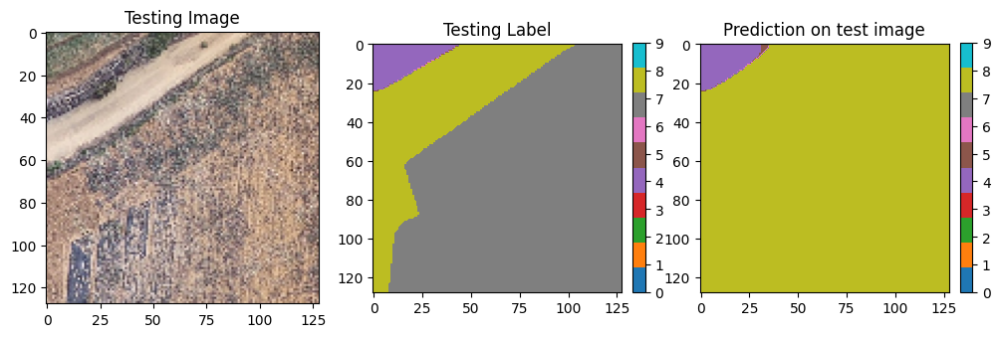

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 85ms/step


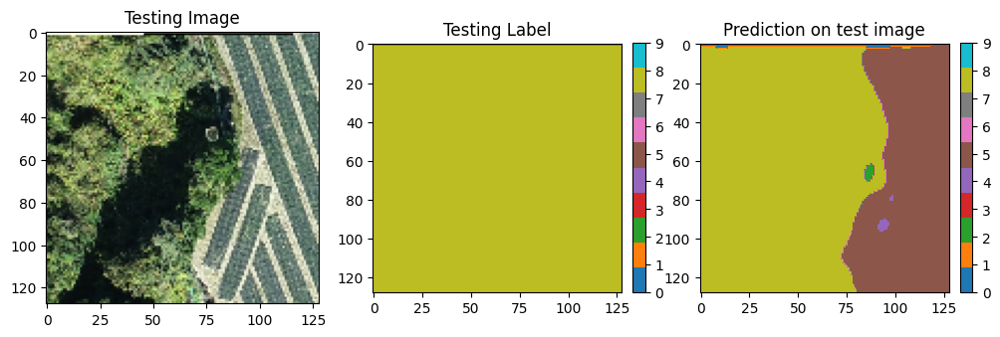

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 60ms/step


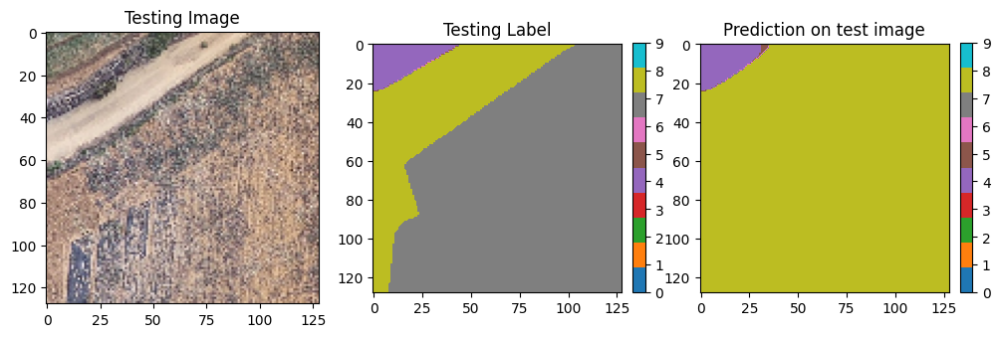

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 37ms/step


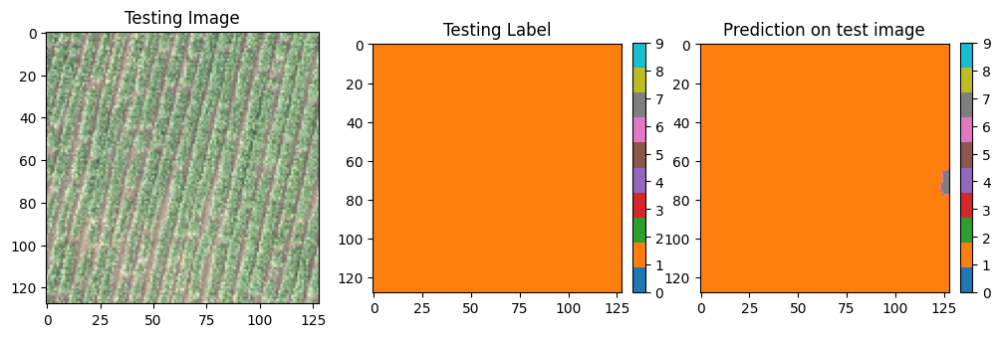

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 36ms/step


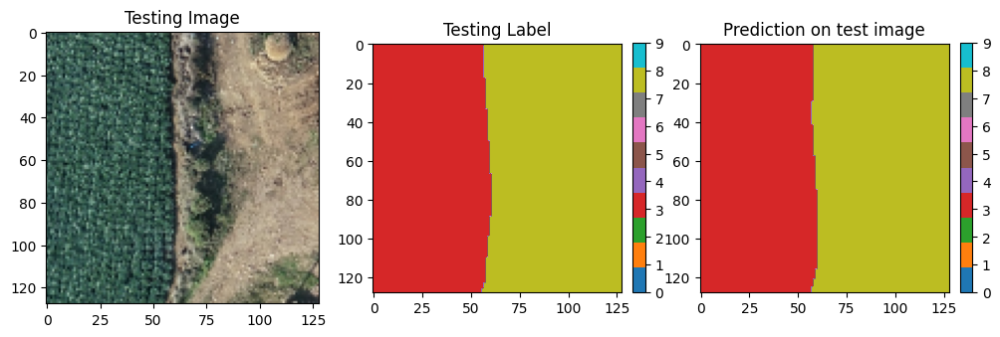

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 37ms/step


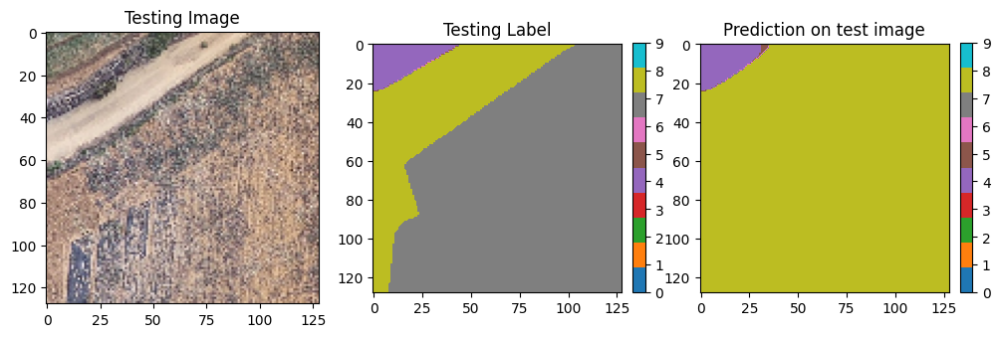

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 35ms/step


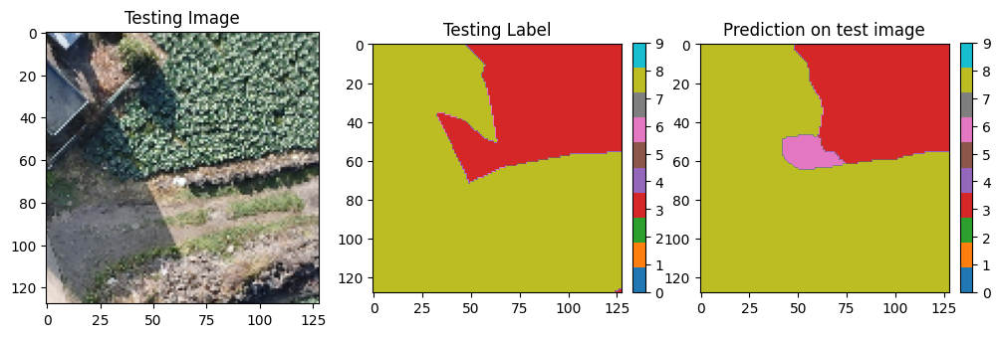

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 45ms/step


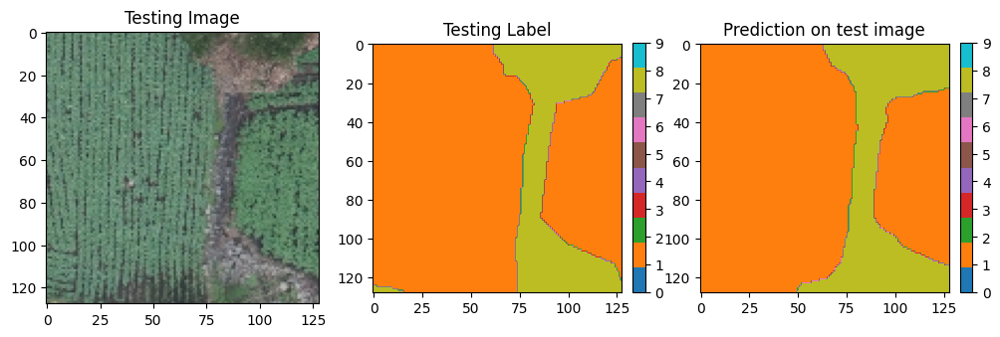

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 47ms/step


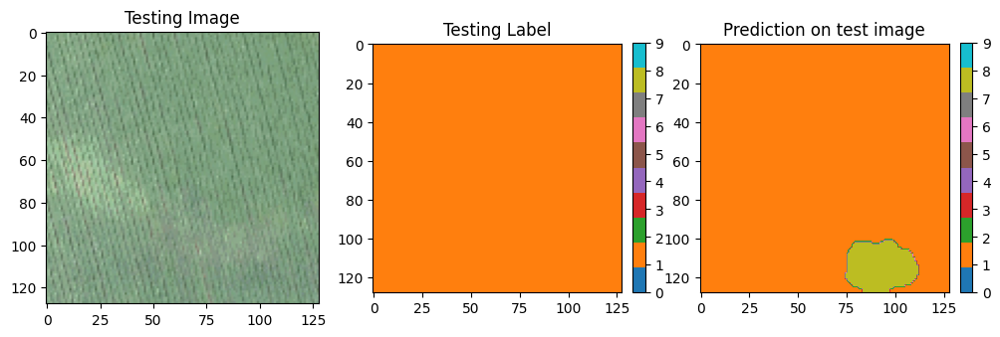

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 81ms/step


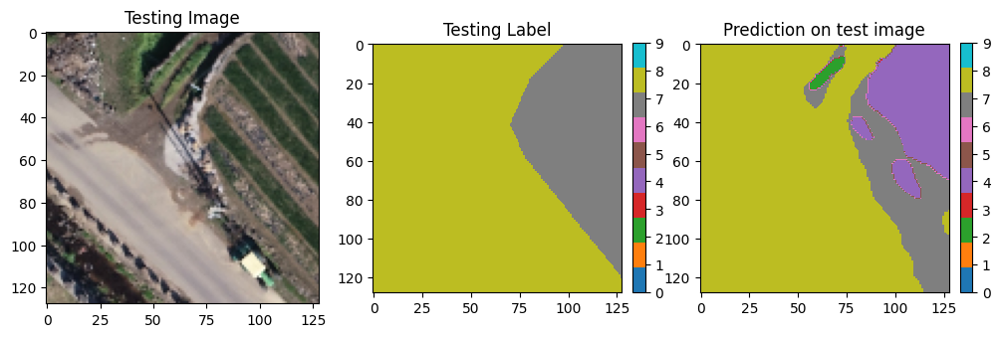

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 70ms/step


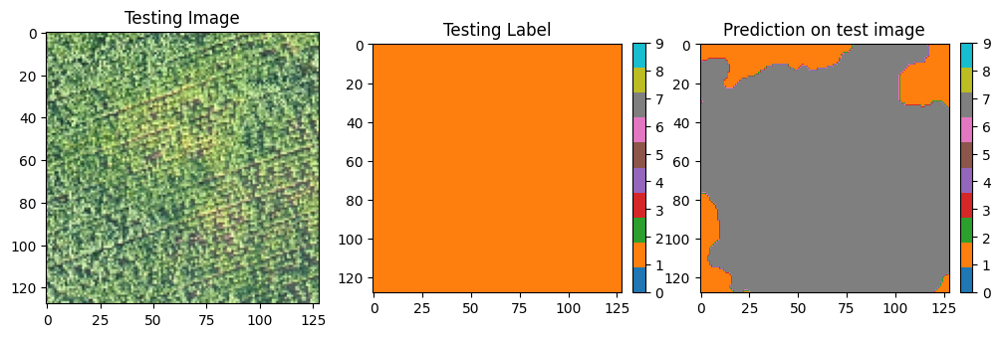

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 51ms/step


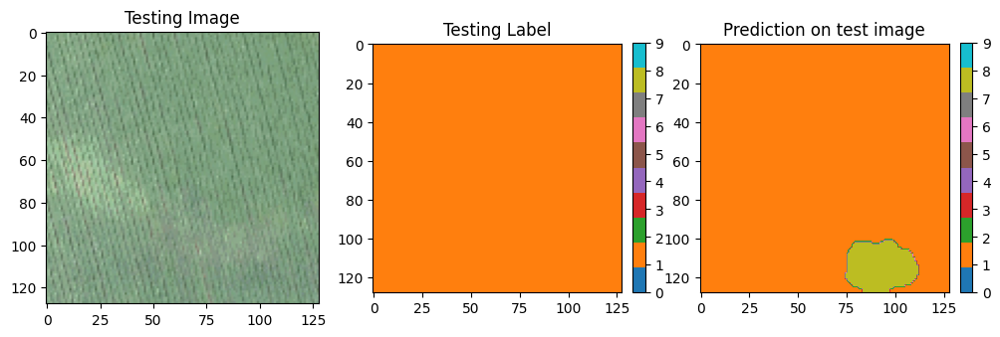

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 68ms/step


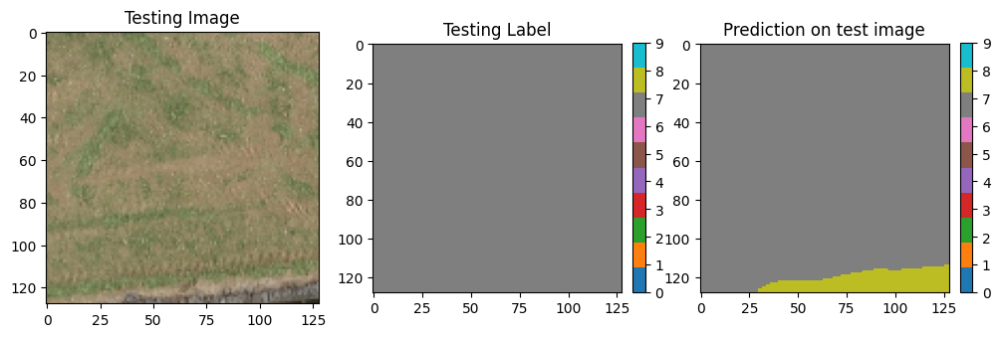

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 69ms/step


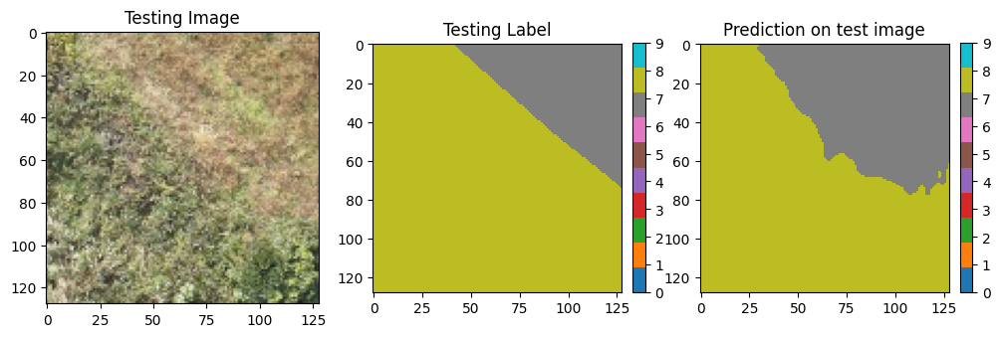

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 40ms/step


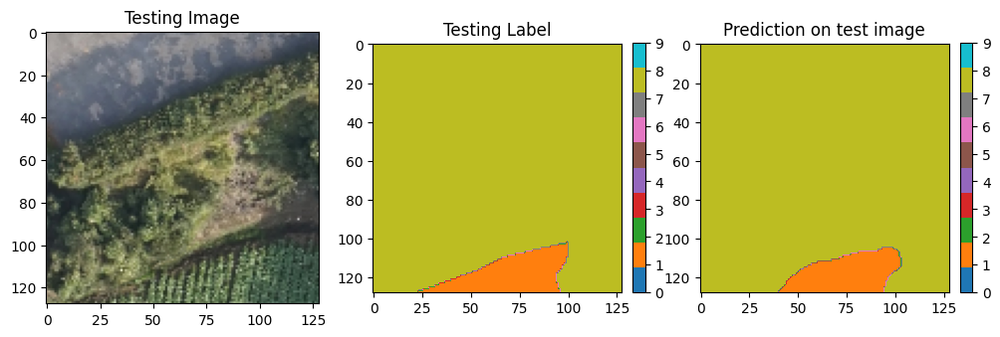

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 42ms/step


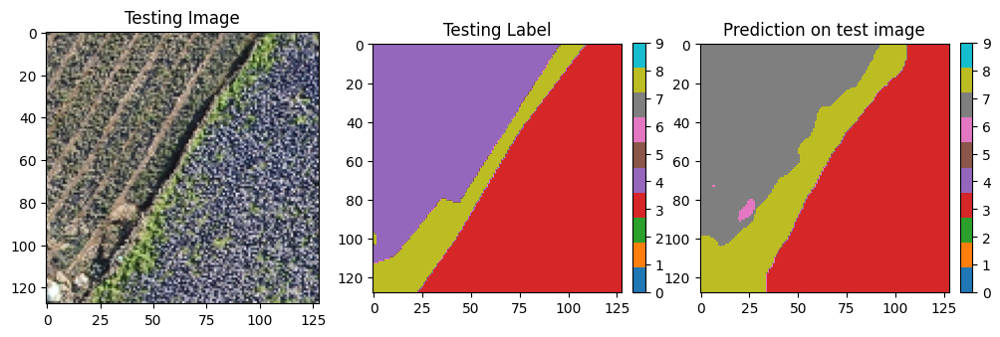

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 54ms/step


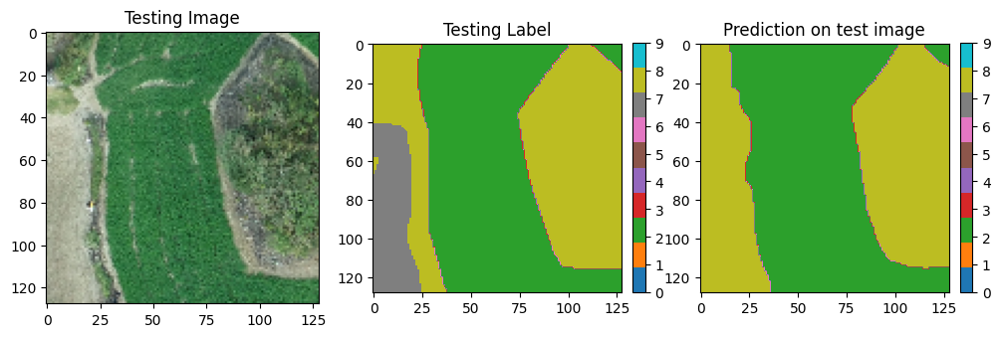

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 42ms/step


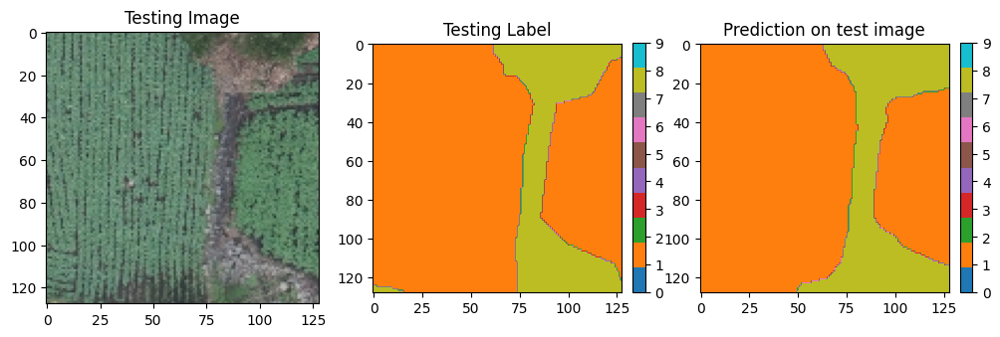

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 47ms/step


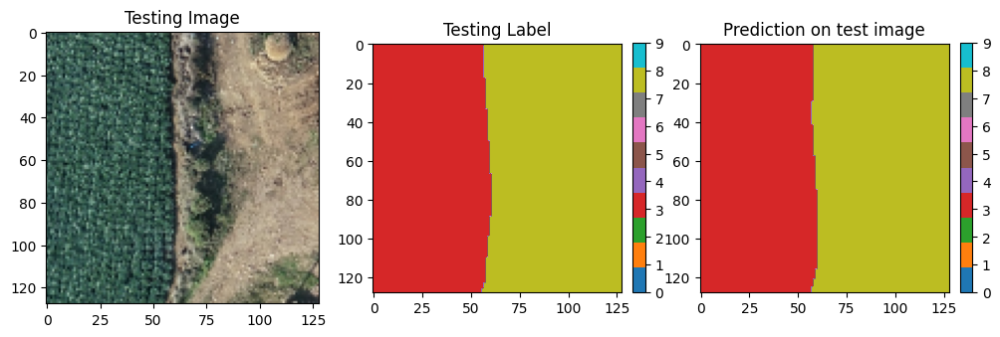

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 45ms/step


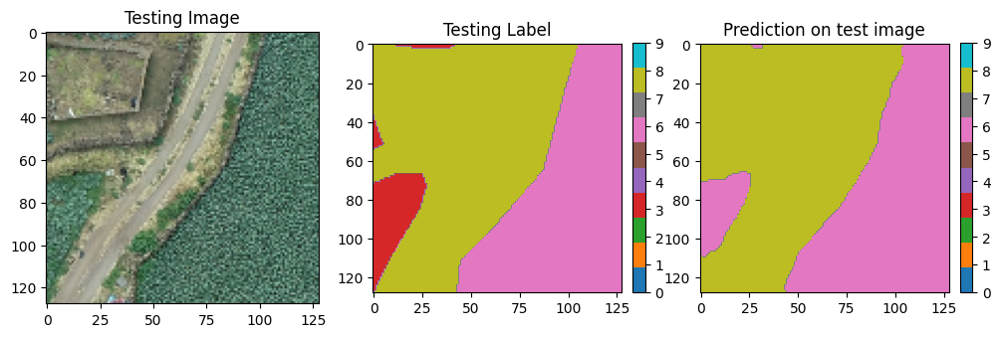

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 46ms/step


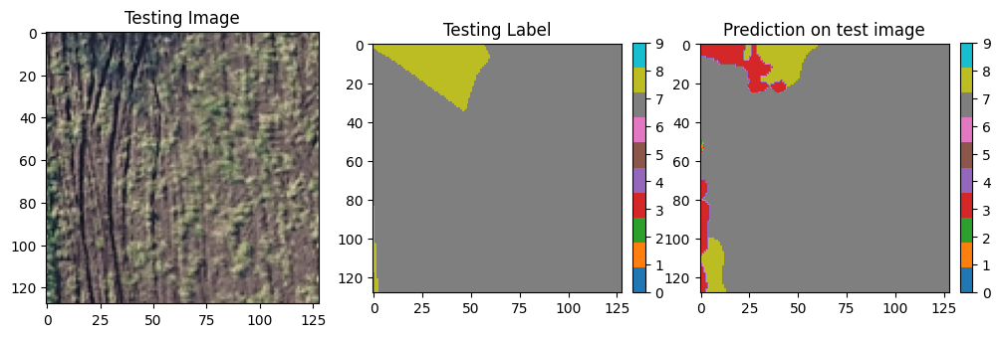

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 49ms/step


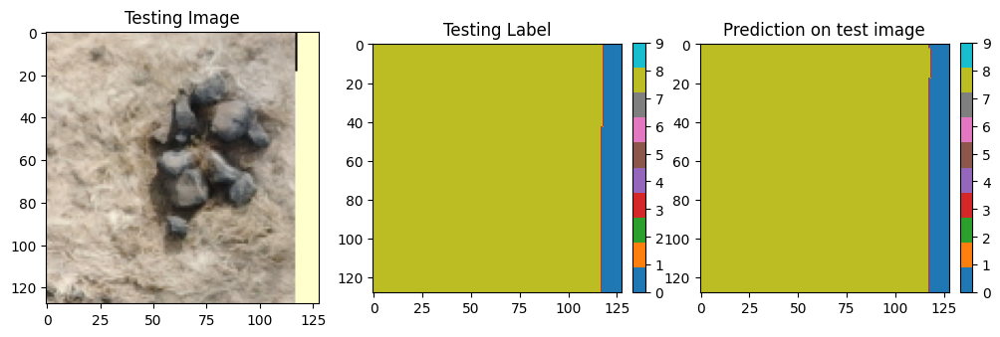

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 45ms/step


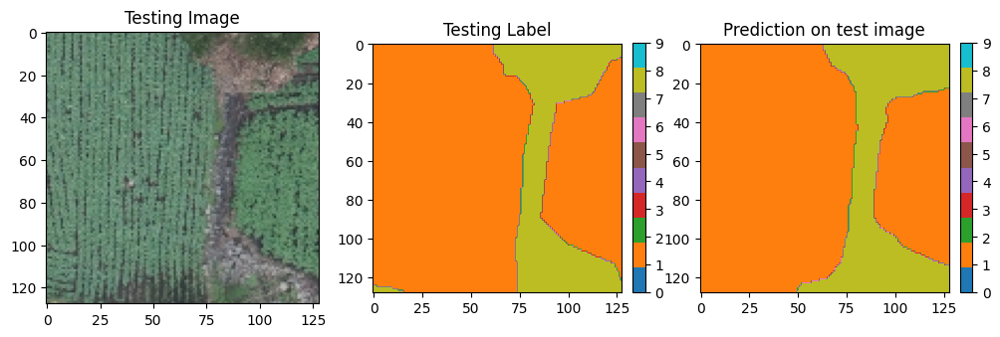

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 53ms/step


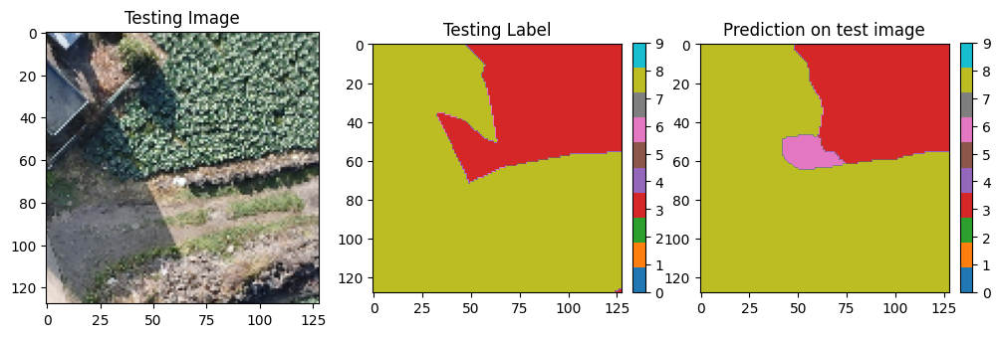

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 49ms/step


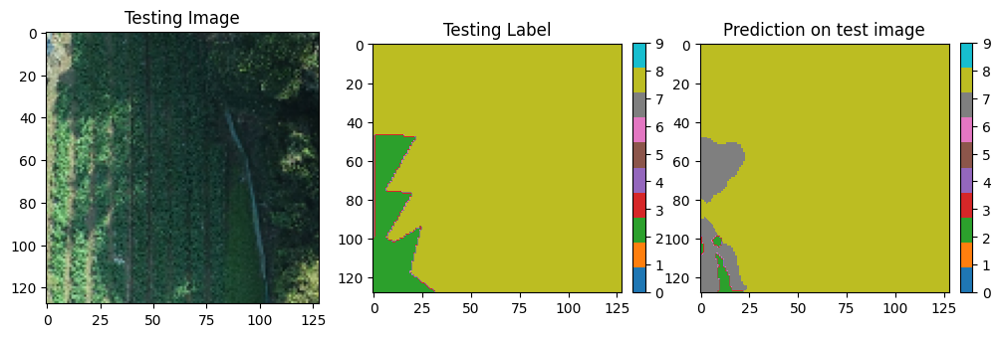

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 53ms/step


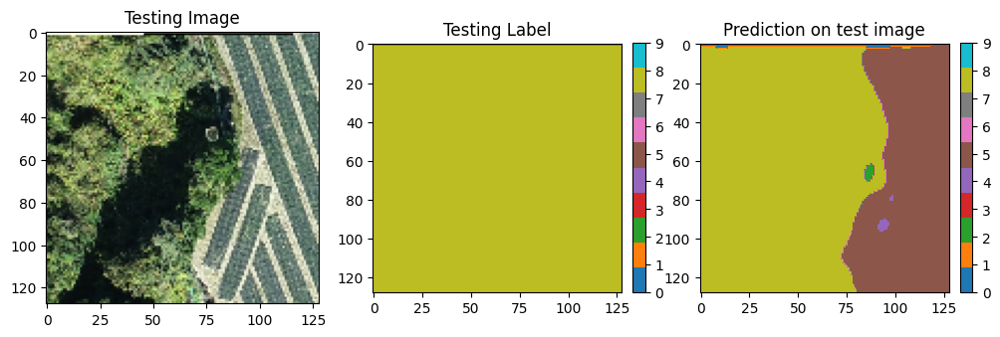

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 63ms/step


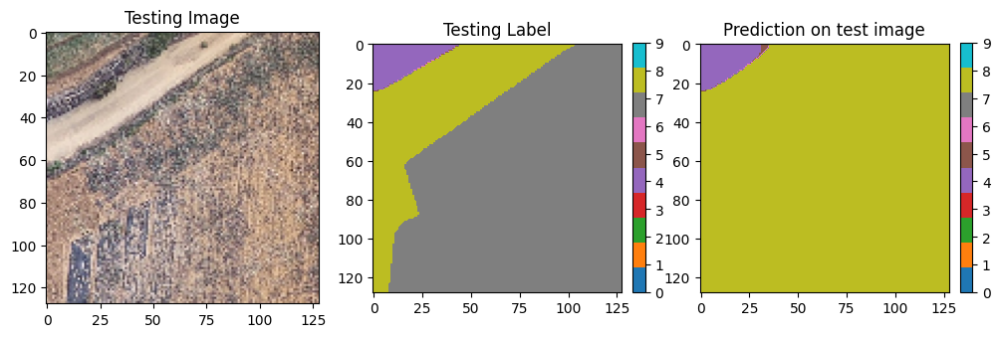

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 68ms/step


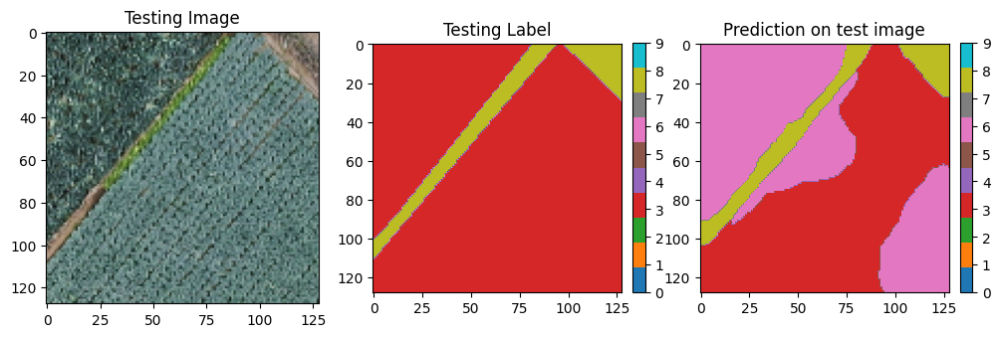

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 59ms/step


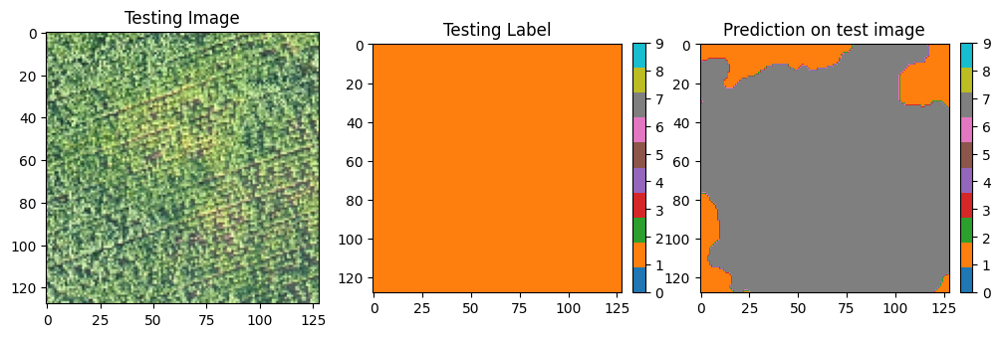

test_img_input의 shape:  (1, 128, 128, 3)
1/1 [==============================] - 0s 50ms/step


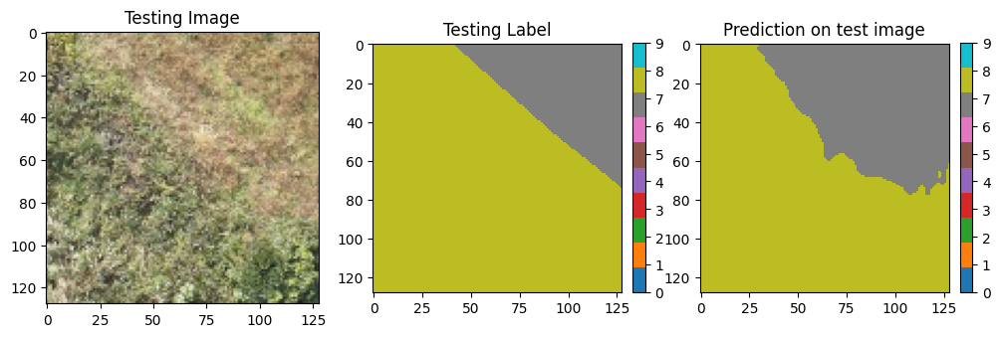

In [ ]:
from matplotlib.colors import ListedColormap

# Create a colormap
cmap = ListedColormap(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'])

# Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
for i in range(30):
  test_img_number = random.randint(0, len(test_image_batch)-1)
  test_img = test_image_batch[test_img_number]
  ground_truth=test_mask_batch[test_img_number]
  ground_truth = np.argmax(ground_truth, axis=2)
  test_img_norm = test_img[:,:,:]
  test_img_input = np.expand_dims(test_img_norm, 0)
  print("test_img_input의 shape: ", test_img_input.shape)

  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  plt.figure(figsize=(12, 8))

  # Testing Image
  plt.subplot(131)
  plt.title('Testing Image')
  plt.imshow(test_img / 255.0)


  # Testing Label
  plt.subplot(132)
  plt.title('Testing Label')
  im1 = plt.imshow(ground_truth, cmap=cmap, vmin=0, vmax=9)    # vmin, vmax to set the colorbar range
  plt.colorbar(im1, fraction=0.046, pad=0.04, ticks=range(10))  # ticks to set the colorbar ticks

  # Prediction on test image
  plt.subplot(133)
  plt.title('Prediction on test image')
  im2 = plt.imshow(predicted_img, cmap=cmap, vmin=0, vmax=9)  # vmin, vmax to set the colorbar range
  plt.colorbar(im2, fraction=0.046, pad=0.04, ticks=range(10))  # ticks to set the colorbar ticks

  plt.show()
